In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

In [2]:
img = plt.imread("2693.jpg")
img = img[400:,:]

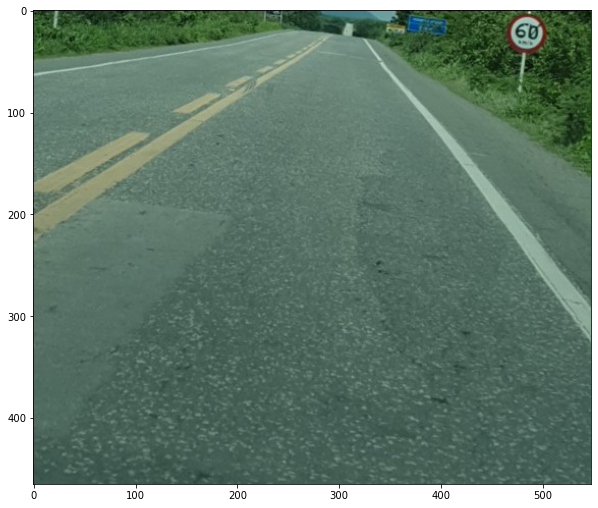

In [3]:
def show(img, gray=False):
    plt.figure(figsize=(10, 10))
    if gray:
        plt.imshow(img, cmap="gray")
    else:
        plt.imshow(img)
show(img)

# Filtragem Espacial

In [4]:
msk = np.ones((3,3))
msk

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]])

In [5]:
msk * np.array([1,2,3])

array([[1., 2., 3.],
       [1., 2., 3.],
       [1., 2., 3.]])

In [6]:
np.dot(msk, np.array([1,2,3]))

array([6., 6., 6.])

In [7]:
msk = msk/9
msk

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

In [8]:
msk2 = np.ones((10,10))/100
msk2

array([[0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01]])

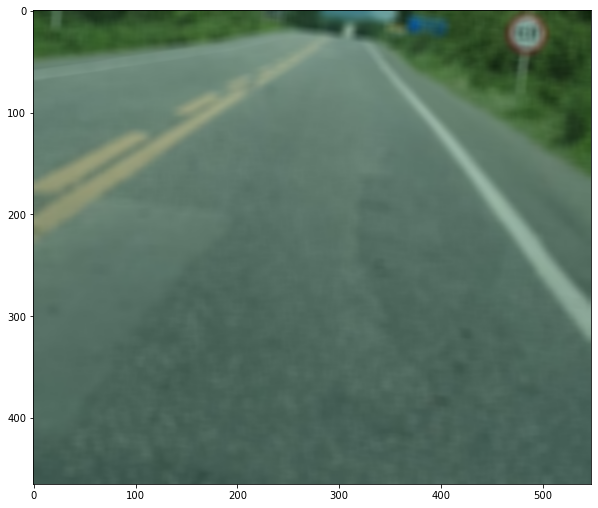

In [9]:
### a img foi borrada como com uma malha quadrada/pixelado
show(cv2.filter2D(img, -1, msk2))

In [10]:
True in cv2.filter2D(img, -1, np.ones((10,10))/3) <255 # Pq?

False

In [11]:
gss = np.array([[0,1,0], 
                [1,4,1],
                [0,1,0]])/9 # Pq por 9?
gss

array([[0.        , 0.11111111, 0.        ],
       [0.11111111, 0.44444444, 0.11111111],
       [0.        , 0.11111111, 0.        ]])

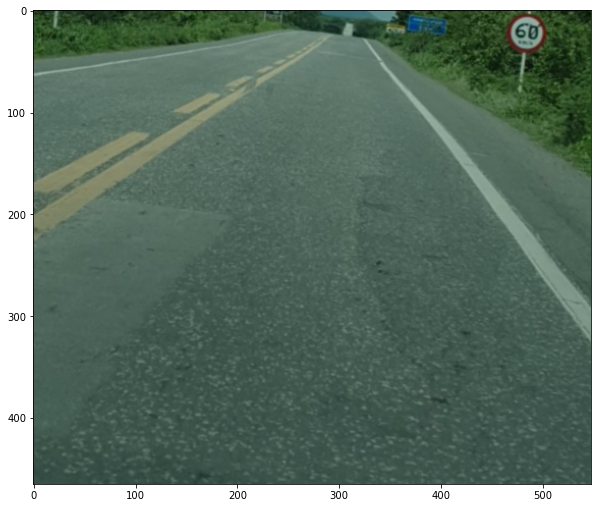

In [12]:
show(cv2.filter2D(img, -1, gss))

## Diferença entre os filtros
### Malhas
- O filtro gaussiano provoca uma malha mais arredondada
- O filtro linear provoca uma malha mais quadriculada

In [13]:
def circle_ones(n=10):
    mtx = np.zeros((n,n))
    r = n
    c = 2
    d = 2*r + c
    rx, ry = d/2, d/2
    x, y = np.indices((d, d))
    mtx = (np.abs(np.hypot(rx - x, ry - y)-r) < 0.4).astype(int)
    return mtx
mtx = circle_ones(4)
mtx.shape

(10, 10)

In [14]:
mtx

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [0, 0, 1, 1, 0, 0, 0, 1, 1, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 1, 1, 0, 0, 0, 1, 1, 0],
       [0, 0, 0, 0, 1, 1, 1, 0, 0, 0]])

In [15]:
radius = 4
a = np.zeros((10, 10)).astype('uint8')
d = 2*radius + 2
cx, cy = 5, 5 # The center of circle
y, x = np.ogrid[-radius: radius, -radius: radius]
index = x**2 + y**2 <= radius**2
a[cy-radius:cy+radius, cx-radius:cx+radius][index] = 1

In [16]:
a

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 1, 1, 1, 1, 1, 0, 0],
       [0, 0, 1, 1, 1, 1, 1, 1, 1, 0],
       [0, 0, 1, 1, 1, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0],
       [0, 0, 1, 1, 1, 1, 1, 1, 1, 0],
       [0, 0, 1, 1, 1, 1, 1, 1, 1, 0],
       [0, 0, 0, 1, 1, 1, 1, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=uint8)

In [17]:
gss2 = cv2.getGaussianKernel(10, 3)
gss2.shape
gss2

array([[0.04765414],
       [0.07432252],
       [0.10372544],
       [0.12953739],
       [0.14476051],
       [0.14476051],
       [0.12953739],
       [0.10372544],
       [0.07432252],
       [0.04765414]])

## Filtro Laplaciano 

In [18]:
c = 5
ones = -1 # supostamente define borda de entrada/saída, mas fica igual msk
lpc = np.array([[0,ones,0], 
                [ones,-4,ones],
                [0,ones,0]])*c # Pq por 9?
lpc

array([[  0,  -5,   0],
       [ -5, -20,  -5],
       [  0,  -5,   0]])

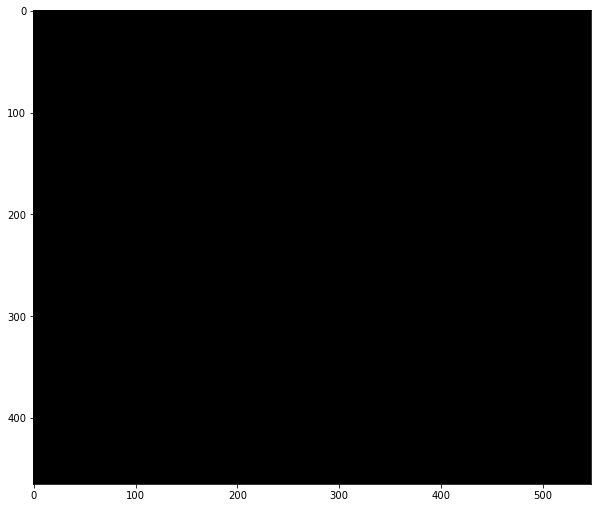

In [19]:
show(cv2.filter2D(img, -1, lpc))

## Filtro de Distâncias

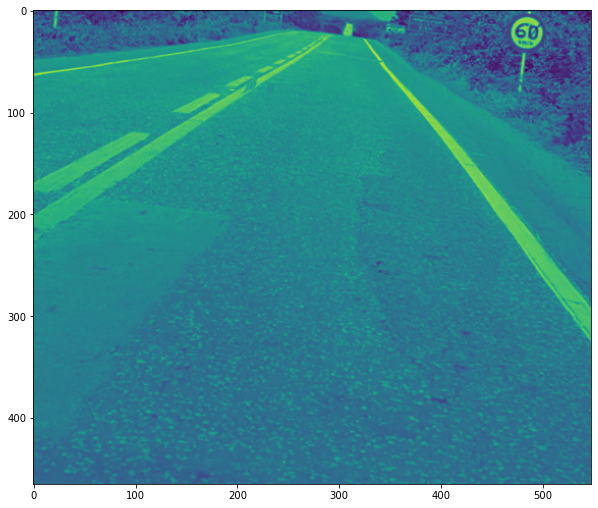

In [20]:
#imgg = gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
imgg = cv2.imread("2693.jpg", 0)
imgg = imgg[400:,:]
show(imgg) #pyplot

cv2.imshow("imgg", imgg)
cv2.waitKey()
cv2.destroyAllWindows()

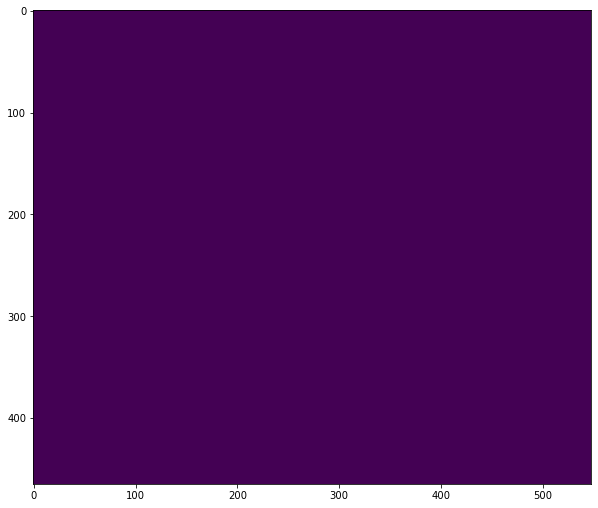

In [21]:
imgd = cv2.distanceTransform(imgg, cv2.DIST_L2, 3)
show(imgd)

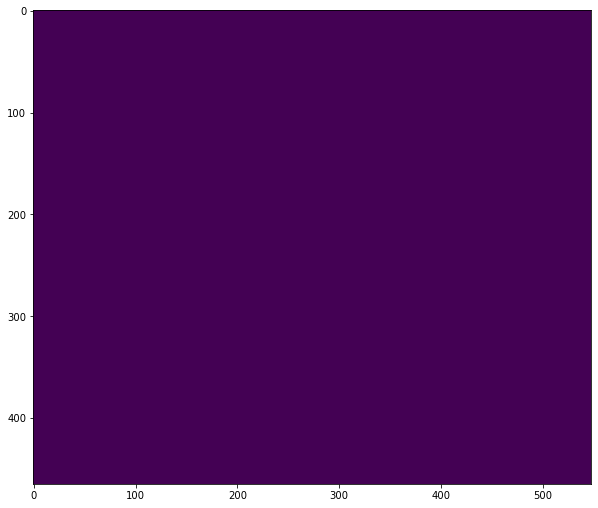

In [22]:
imggn = cv2.normalize(imgd, 0, 1, cv2.NORM_MINMAX)
show(imggn)

# Filtro Laplaciano

In [23]:
# Escreva o código aqui

-------------

# Transformada de Fourrier

In [24]:
x = np.arange(1, 301, dtype=float)
x.shape

(300,)

In [25]:
f1 = 2*np.sin(x/50 + 1)

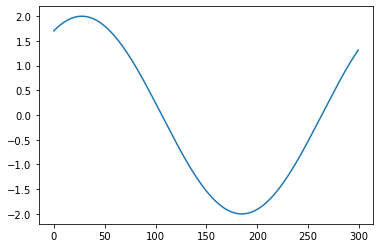

In [26]:
plt.plot(f1)
plt.show()

In [27]:
f2 = 5*np.sin(x/20 + 1)

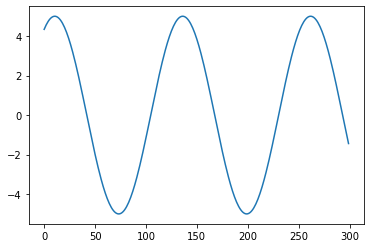

In [28]:
plt.plot(f2)
plt.show()

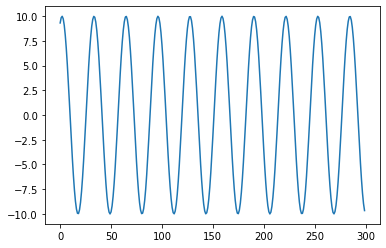

In [29]:
f3 = 10*np.sin(x/5 + 1)
plt.plot(f3)
plt.show()

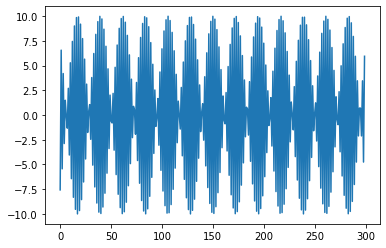

In [30]:
f3_1 = 10*np.sin(3*x+1)
plt.plot(f3_1)
plt.show()

## Soma das Funções
Observe que a função f4 é a soma das frequências das outras três funçóes

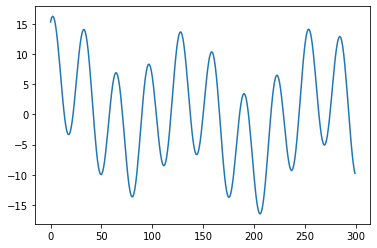

In [31]:
f4 = f1 + f2 + f3
plt.plot(f4)
plt.show()

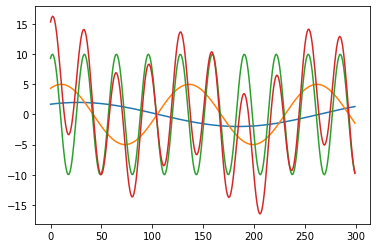

In [32]:
plt.plot(f1)
plt.plot(f2)
plt.plot(f3)
plt.plot(f4)
plt.show()

In [33]:
f4 += abs(min(f4))
f4 /= max(f4)

In [34]:
im = np.array([f4])

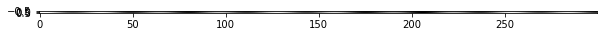

In [35]:
show(im, gray = True)

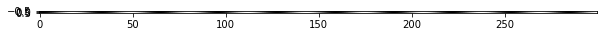

In [36]:
show(im-np.array([f3]), gray=True)

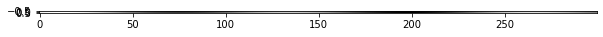

In [37]:
im2 = f1 + f2
im2 = np.array([im2])
show(im2, gray = True)

# Transformada Discreta de Fourrier
Vamos discretizar o domínio da frequência para aplicar em imagens, com valores discretos e finitos

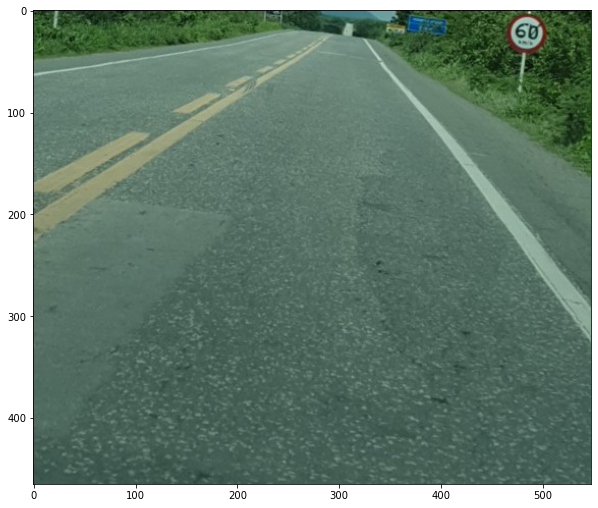

In [38]:
show(img)

In [39]:
im = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

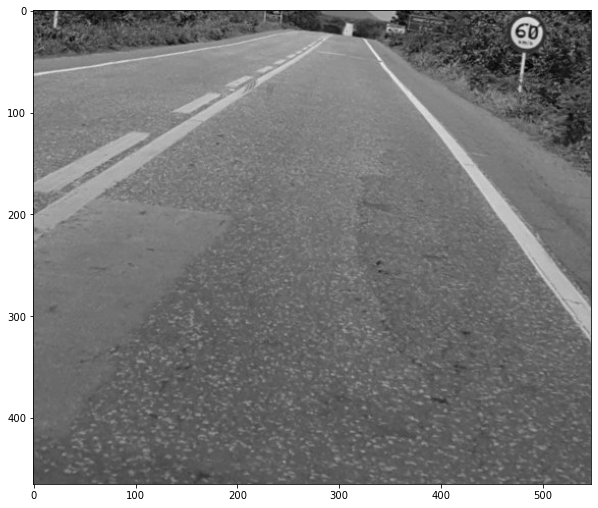

In [40]:
show(im, gray=True)

In [41]:
im = im.astype('float')
im = im/255

In [42]:
im

array([[0.16078431, 0.21960784, 0.25882353, ..., 0.10588235, 0.20392157,
        0.30588235],
       [0.2745098 , 0.28627451, 0.29019608, ..., 0.08235294, 0.16078431,
        0.24313725],
       [0.30588235, 0.24313725, 0.19607843, ..., 0.05098039, 0.06666667,
        0.09411765],
       ...,
       [0.30588235, 0.30980392, 0.31372549, ..., 0.32156863, 0.32941176,
        0.3254902 ],
       [0.30980392, 0.31372549, 0.31764706, ..., 0.33333333, 0.34901961,
        0.34117647],
       [0.30980392, 0.31372549, 0.31372549, ..., 0.35686275, 0.34901961,
        0.33333333]])

In [43]:
dft = cv2.dft(im, flags = cv2.DFT_COMPLEX_OUTPUT) # o cálculo deve ser no campo dos num complexos

In [44]:
dft

array([[[ 1.02053800e+05,  0.00000000e+00],
        [-1.14146142e+03, -1.75607229e+03],
        [ 2.78658299e+02, -1.34827962e+03],
        ...,
        [-5.35772840e+02,  4.65713818e+02],
        [ 2.78658299e+02,  1.34827962e+03],
        [-1.14146142e+03,  1.75607229e+03]],

       [[-4.58182897e+03, -6.14978864e+03],
        [-4.20335378e+03,  1.11722157e+03],
        [-1.02299616e+03,  1.02561570e+03],
        ...,
        [ 1.21921129e+03,  6.72328938e+02],
        [ 9.56771235e+02,  1.35334161e+03],
        [-1.20903745e+03,  2.44996317e+03]],

       [[-2.52479701e+03, -2.75484113e+02],
        [-6.51402451e+02,  2.21809706e+03],
        [ 7.20738329e+02,  4.11145647e+02],
        ...,
        [-3.72766581e+02, -1.51305303e+03],
        [ 1.42548256e+03, -1.70243021e+03],
        [ 1.47954793e+03,  1.43746433e+03]],

       ...,

       [[-1.62979636e+03, -1.70764946e+02],
        [ 1.47521966e+03,  1.96110694e+02],
        [ 3.57796604e+02,  1.29126216e+03],
        ...,
     

In [45]:
dft.shape

(465, 548, 2)

In [46]:
# correção exclusiva para visualização
mag = cv2.magnitude(dft[:, :, 0], dft[:, :, 1])
mag.shape

(465, 548)

In [47]:
c2 = 10 # valor incorreto afeta a saída, ache o correto para sua imagem
mag = c2*np.log(mag) 

In [48]:
mag

array([[115.33255404,  76.4704664 ,  72.27498817, ...,  65.65108128,
         72.27498817,  76.4704664 ],
       [ 89.44937223,  83.77769042,  72.78344928, ...,  72.38713132,
         74.1299992 ,  79.12807112],
       [ 78.3983344 ,  77.45768668,  67.21138554, ...,  73.51347775,
         77.05452067,  76.31845642],
       ...,
       [ 74.01669535,  73.05321081,  72.00362618, ...,  63.03009087,
         64.61005825,  73.13360401],
       [ 78.3983344 ,  76.31845642,  77.05452067, ...,  57.76590163,
         67.21138554,  77.45768668],
       [ 89.44937223,  79.12807112,  74.1299992 , ...,  64.76934951,
         72.78344928,  83.77769042]])

In [49]:
mag = mag/np.max(mag)
mag

array([[1.        , 0.66304321, 0.62666598, ..., 0.56923287, 0.62666598,
        0.66304321],
       [0.77557783, 0.72640107, 0.63107463, ..., 0.62763833, 0.64275   ,
        0.68608618],
       [0.67975894, 0.67160298, 0.58276162, ..., 0.6374044 , 0.66810729,
        0.66172519],
       ...,
       [0.64176759, 0.63341362, 0.62431312, ..., 0.54650737, 0.5602066 ,
        0.63411068],
       [0.67975894, 0.66172519, 0.66810729, ..., 0.5008638 , 0.58276162,
        0.67160298],
       [0.77557783, 0.68608618, 0.64275   , ..., 0.56158775, 0.63107463,
        0.72640107]])

In [50]:
cv2.imshow("t", mag)
cv2.waitKey()
cv2.destroyAllWindows()

### Nota
Por alguma razão, a imagem utilizada tinha saída de tela branca, mas após o kernel ser restartado apresentou a saída esperada. Aqui está um screenshot

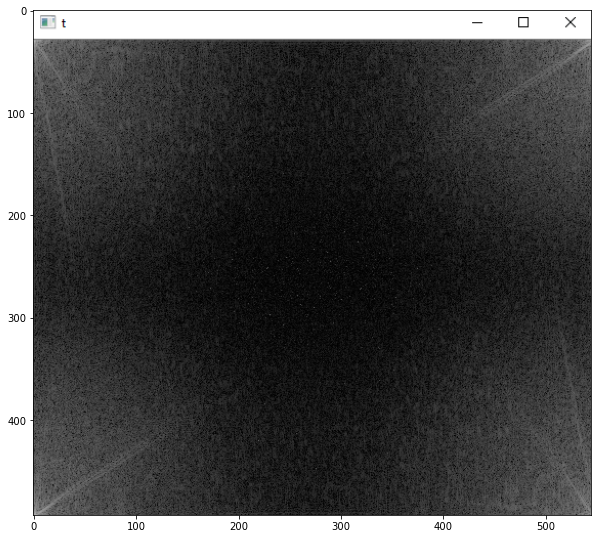

In [52]:
# sem shift
show(plt.imread("frr.png"))

In [ ]:
dft_s = np.fft.fftshift(dft)


---------------

In [ ]:
def lineIntersect2(k_x,k_y,l_x,l_y,m_x,m_y,n_x,n_y):
    det = (n_x - m_x) * (l_y - k_y)  -  (n_y - m_y) * (l_x - k_x)
    if (det == 0.0):
        return 0
    s = ((n_x - m_x) * (m_y - k_y) - (n_y - m_y) * (m_x - k_x))/ det
    t = ((l_x - k_x) * (m_y - k_y) - (l_y - k_y) * (m_x - k_x))/ det
    if (s >= 0 and s<=1) and (t>=0 and t<=1):
        print("({},{}) ({},{})".format(m_x,m_y,n_x,n_y))
        return 1
    else:
        return 0

# Wavelets
Decomposições em ondas finitas, limitadas, portanto o termo que se traduziria como ondinhas.

Seu maio uso é para compactação de imagens. Também uso para som e vídeo.

In [ ]:
# transformada Wavelet - Imagem em transformada Wavelet
# Transformada de Haar 

# Processamento Morfológico de Imagem

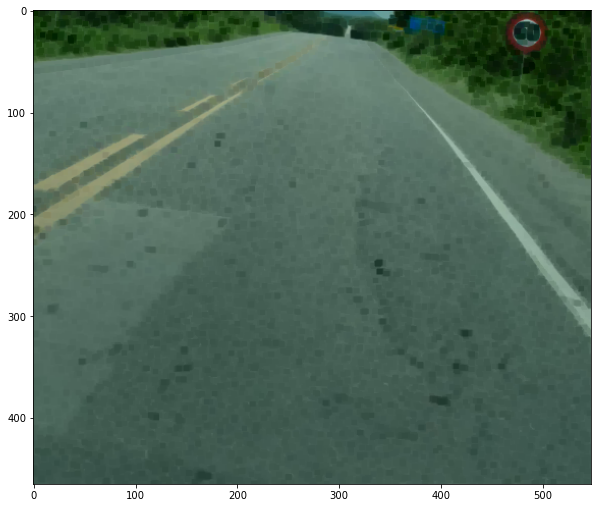

In [4]:
kernel = np.ones((5,5), np.uint8) # elemento estruturante
erosao = cv2.erode(img, kernel) # pode definir quanta svezes o filtro passa
show(erosao)

In [10]:
def show_cv2():
    cv2.imshow('img', img)
    cv2.waitKey()

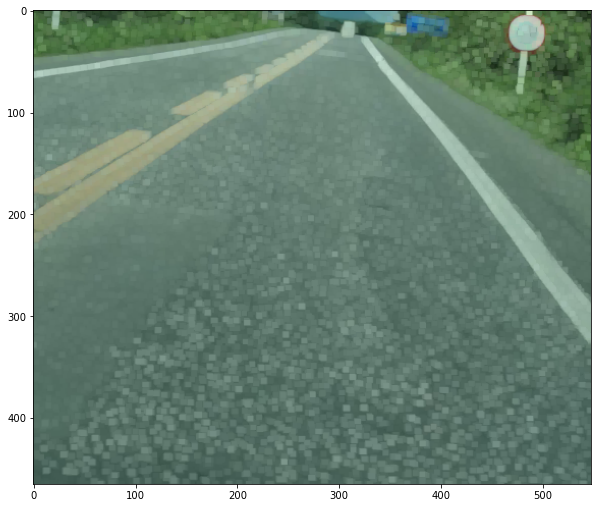

In [11]:
# a dilatação procura por interseção
# pixel 0 não é considerado preto
dilatacao = cv2.dilate(img, kernel)
show(dilatacao)

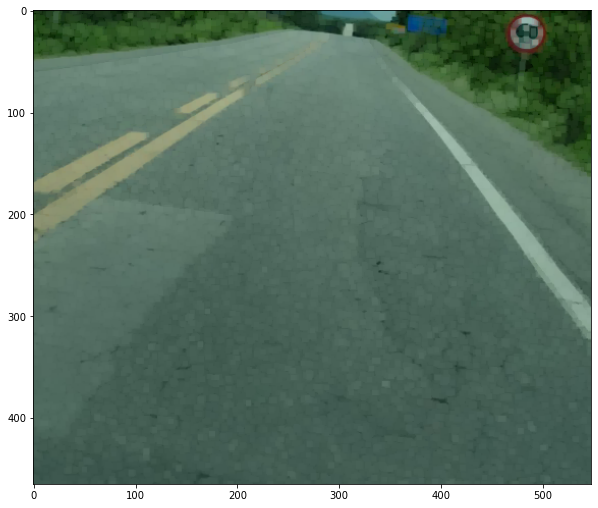

In [16]:
img2 = cv2.erode(img, kernel)
img2 = cv2.dilate(img2, kernel)
show(img2)

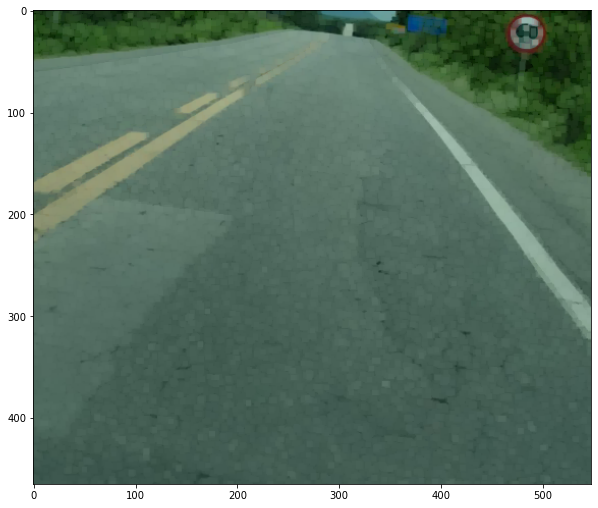

In [19]:
img3 = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
show(img3)

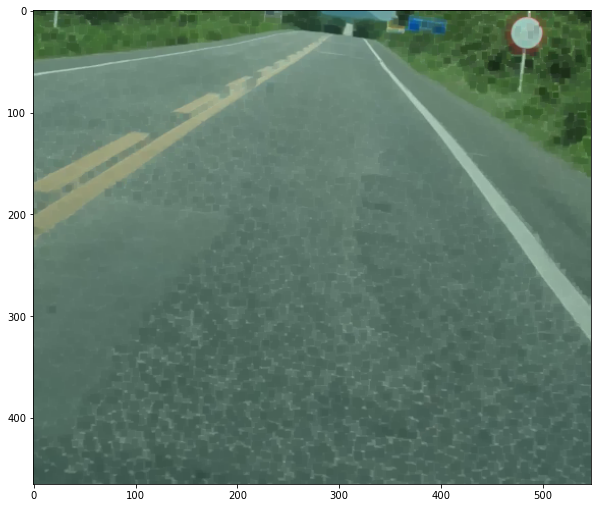

In [20]:
fecha = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
show(fecha)

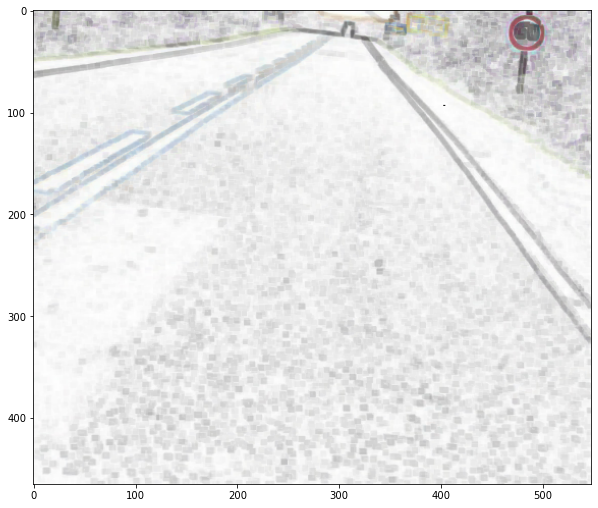

In [22]:
# subtrai uma da outra e você tem as bordas
show(erosao - dilatacao)

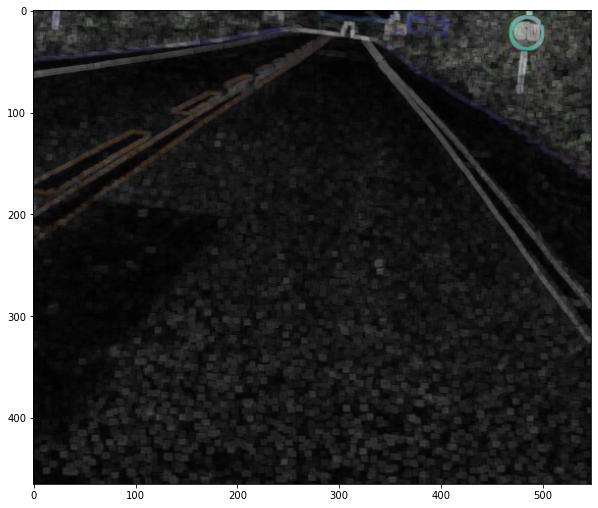

In [23]:
show(dilatacao - erosao)

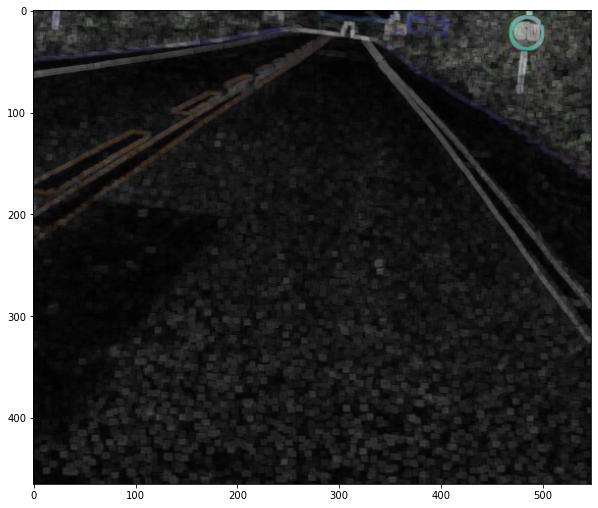

In [24]:
diff = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
show(diff)

<ipython-input-35-a993001993f2>:1: RuntimeWarning: divide by zero encountered in true_divide
  show(img / diff**2)
<ipython-input-35-a993001993f2>:1: RuntimeWarning: invalid value encountered in true_divide
  show(img / diff**2)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


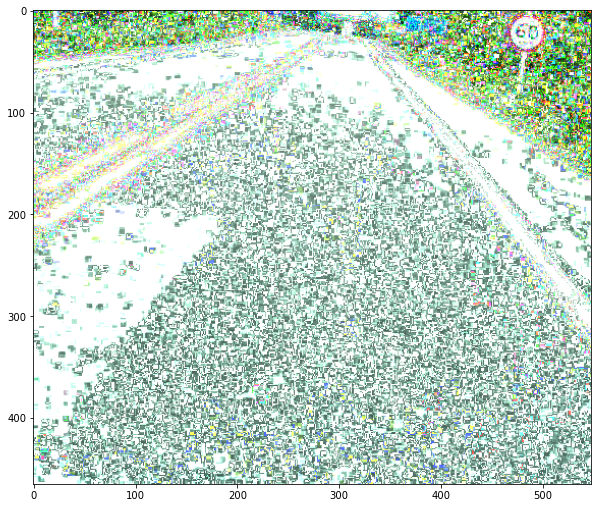

In [35]:
show(img / diff**2)

## Flood Fill
Algoritmo do "balde de tinta" do Paint

Você pode detectar bordas, e aplicar um filtro na imagem original alterando as intensidades dos pixels, e então somando a borda que tem tonalidade diferente. Os tons dentro serão sempre diferentes da borda. Assim, o Flood FIll pode ser usado para colorir a região dentro da borda na imagem original através de uma soma entre esse Flood Fill e a imagem original.

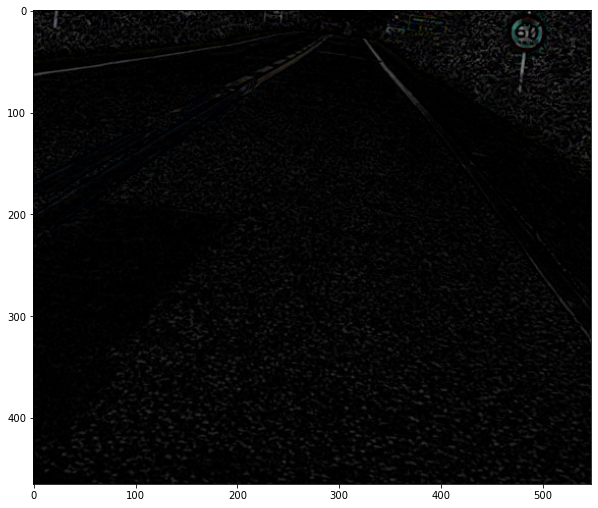

In [40]:
top = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel) # pontos de abertura
black = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel) # pontos de fechamento
show(top)# buracos que são falhas na img
# sabendo as falhas fecháveis pelo filtro, vc sabe oq remover da imagem
# se ficar toda preta, então n tem oq corrigir de falhas

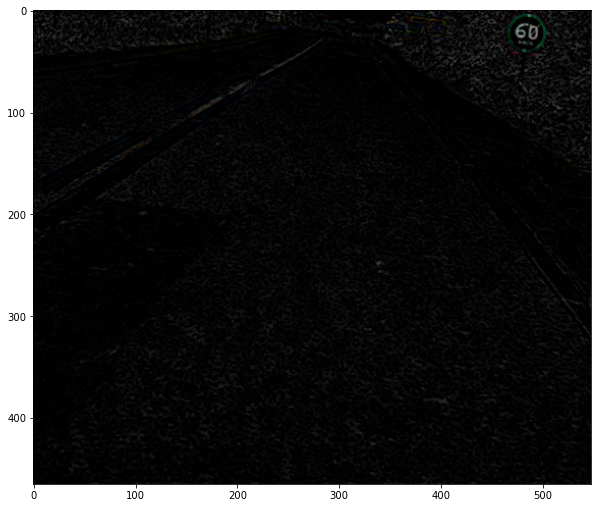

In [41]:
show(black) # buracos q fazem parte

In [46]:
strc = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
elipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
cross = cv2.getStructuringElement(cv2.MORPH_CROSS, (5,5))

array([[0, 0, 1, 0, 0],
       [0, 0, 1, 0, 0],
       [1, 1, 1, 1, 1],
       [0, 0, 1, 0, 0],
       [0, 0, 1, 0, 0]], dtype=uint8)

# Fecho Morfológico

# Exemplos

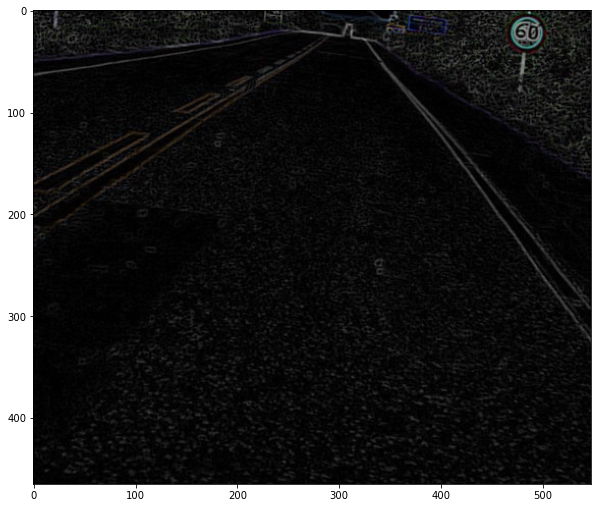

In [6]:
erode = cv2.morphologyEx(img, cv2.MORPH_ERODE, kernel)
show(img - erode)

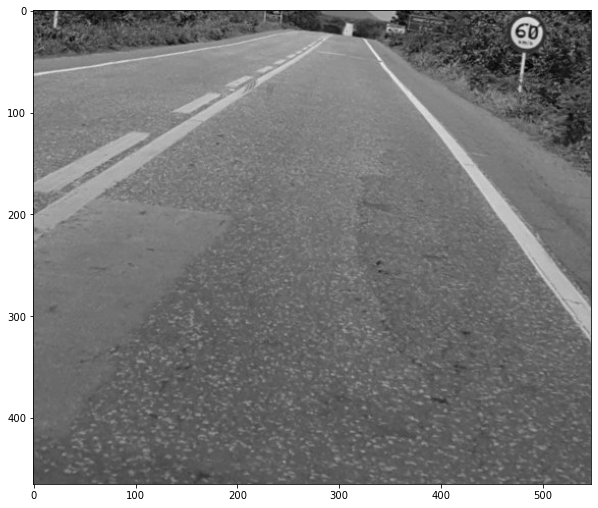

In [10]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
show(gray, gray=True)

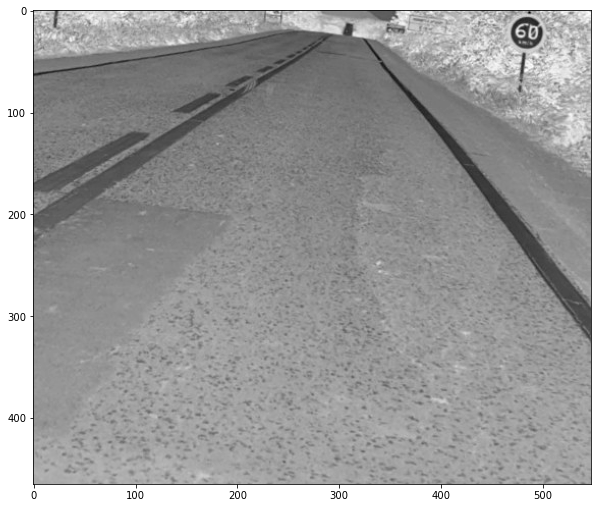

In [14]:
# medição de apagamento de faixa amarela
grayInv = cv2.bitwise_not(gray)
show(grayInv, True)

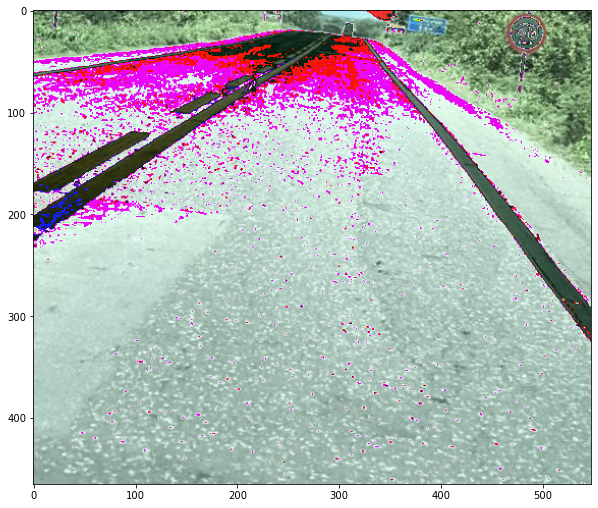

In [31]:
grayRedo = cv2.cvtColor(grayInv, cv2.COLOR_GRAY2RGB)
show(img - grayRedo)

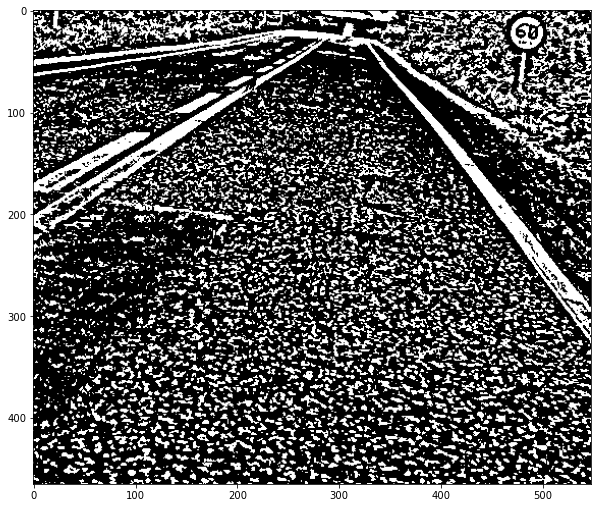

In [29]:
bw = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, -2)
horizontal, vertical = np.copy(bw), np.copy(bw)
show(bw, True)

In [25]:
lins, cols = vertical.shape[0], horizontal.shape[1]

465

In [36]:
horizontal_size = cols // 50
hor_strc = cv2.getStructuringElement(cv2.MORPH_RECT, 
                                    (horizontal_size, 1))

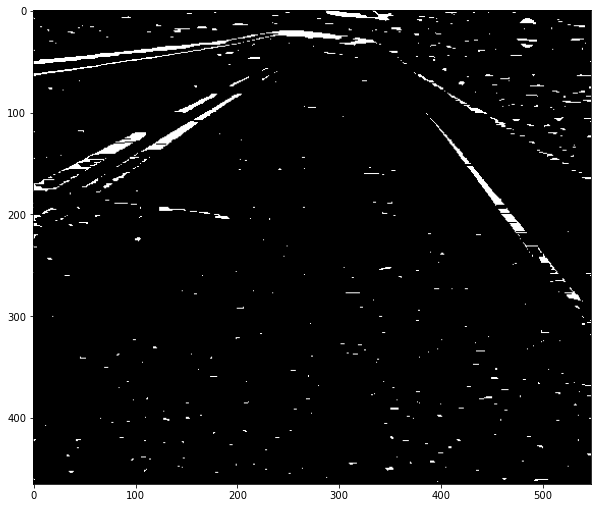

In [37]:
hrz = cv2.erode(horizontal, hor_strc)
show(hrz, True)

In [67]:
vert_size = vertical.shape[0] // 70
ver_strc = cv2.getStructuringElement(cv2.MORPH_RECT, 
                                    (1, vert_size))

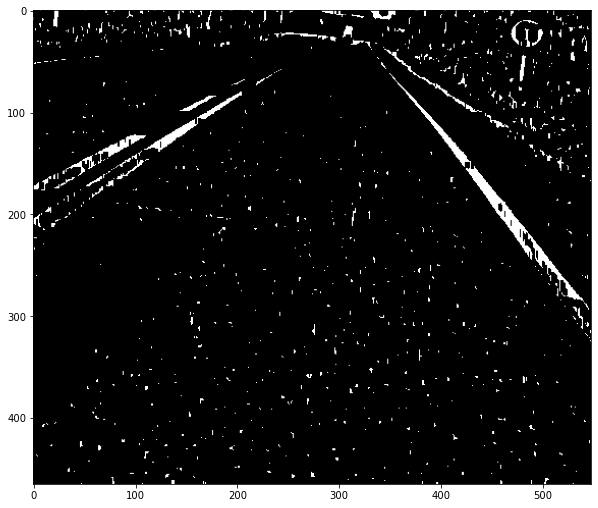

In [68]:
# Não muito útil para faixas dado que estão inclinadas
# útil para detecção de placas
vtc = cv2.erode(vertical, ver_strc)
show(vtc, True)

# Linearização

Thresholding

Esses parâmetros precisam de thresholds certos para cada imagem. 

In [9]:
img_bw = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
bw = cv2.threshold(img_bw, 127, 255, cv2.THRESH_BINARY) # retorna uma tupla (limiar utilizado, filtro)
cv2.imshow('t', bw[1])
cv2.waitKey()
cv2.destroyAllWindows()

In [18]:
# mais ruído
bw1 = cv2.adaptiveThreshold(img_bw, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
cv2.imshow('t', bw1)
cv2.waitKey()
cv2.destroyAllWindows()

In [17]:
# redução de ruído
# como se aplciasse o filtro gaussiano
# pega o limiar dessa região com gaussiano
bw1 = cv2.adaptiveThreshold(img_bw, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
cv2.imshow('t', bw1)
cv2.waitKey()
cv2.destroyAllWindows()

In [23]:
bw3 = cv2.threshold(img_bw, 
                   0,# o limiar não é definido por nós, sim pelo algoritmo
                   255, # valor máximo
                   cv2.THRESH_BINARY+cv2.THRESH_OTSU # não só a linear como com a de Otsu
                   )
bw3[0] # melhor limiar para a imagem encontrda pelo algoritmo

104.0

In [24]:
cv2.imshow('t', bw3[1])
cv2.waitKey()
cv2.destroyAllWindows()

# Segmentação de Imagens

Detector de bordas de Canny
Bordaas finas, 1px e interconectada
Funciona em vários passos, um algoritmo

redução de ruído > calcular gradiente da img > supressão de não-máximos > 
limiarizção (estebelce valor max e min: max = borda, min = não-borda)

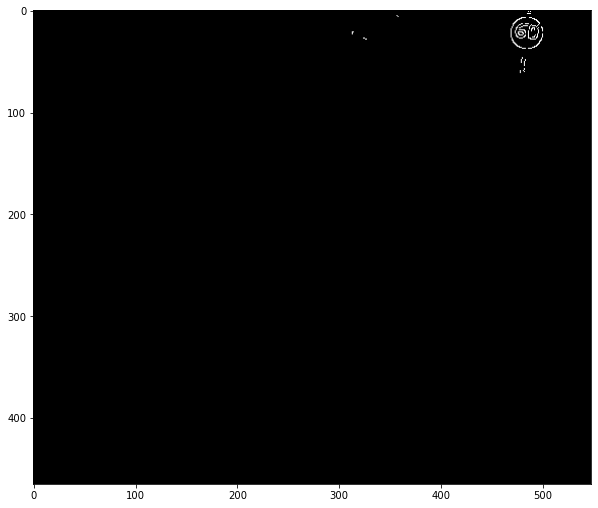

In [7]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
edges = cv2.Canny(img_gray, img_gray.shape[0], img_gray.shape[1])
show(edges, True) # binarizar as imagens torna as bordas mais perceptíveis

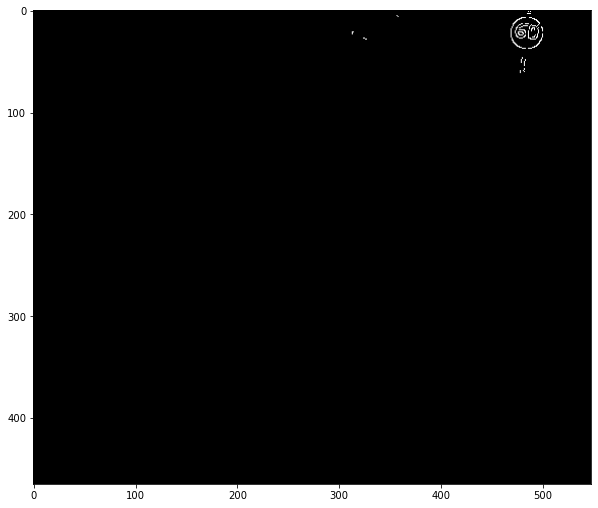

In [9]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
edges = cv2.Canny(img_gray, img_gray.shape[1], img_gray.shape[0])
show(edges, True)

C:\Users\Gustavo\miniconda3\envs\Teste\lib\site-packages\matplotlib\cbook\__init__.py:682: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  x = np.array(x, subok=True, copy=copy)


TypeError: Image data of dtype object cannot be converted to float

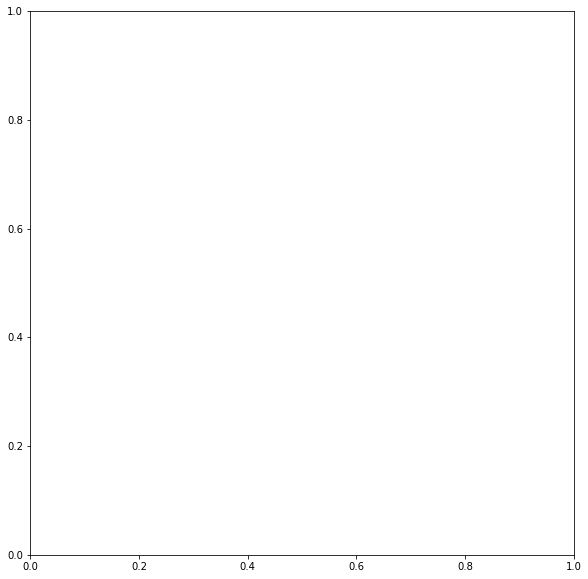

In [13]:
# Binarização
img_bina = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
show(img_bina, True)

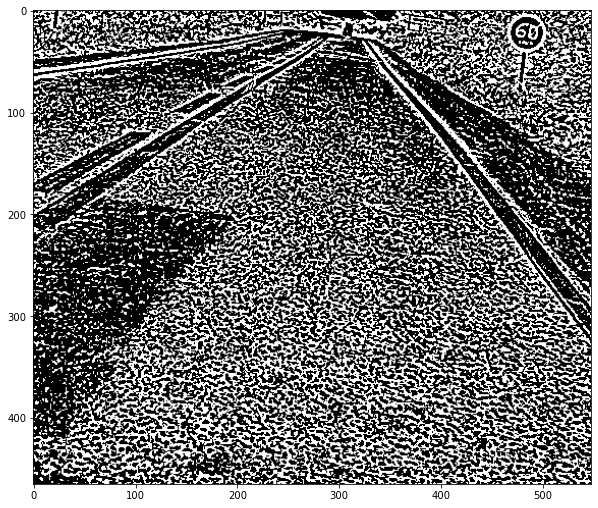

In [15]:
img_adapt = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
imb = 255-img_adapt
show(imb, True)

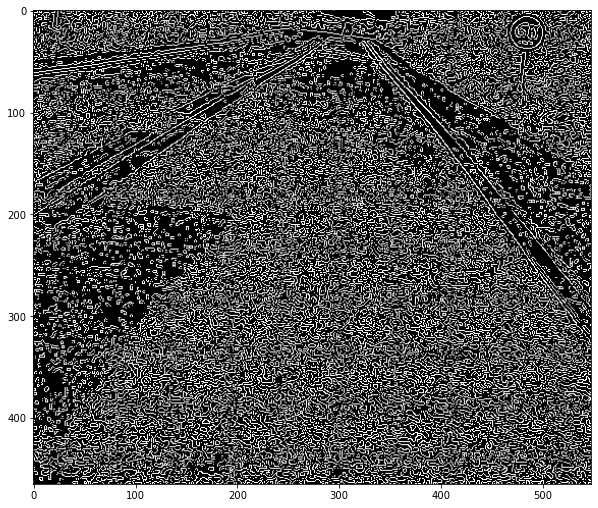

In [16]:
img_lin = cv2.Canny(imb, imb.shape[0], img.shape[1])
show(img_lin, True) # serve para txturas, ruído aqui contribui

# Transformada de Hough

detecta curvas e ponto que obdeçam uma função

Estudar os padrões de curvas em um rosto humano, e extrair essas funções por método numérico e machine learning
Usa esse algoritmo para descobrir e também outro para etabelecer os padrões

Desenha na tela linhas equivalentes a funções que correspondam as aprendidas e então desenha
Rosto humano desenhado

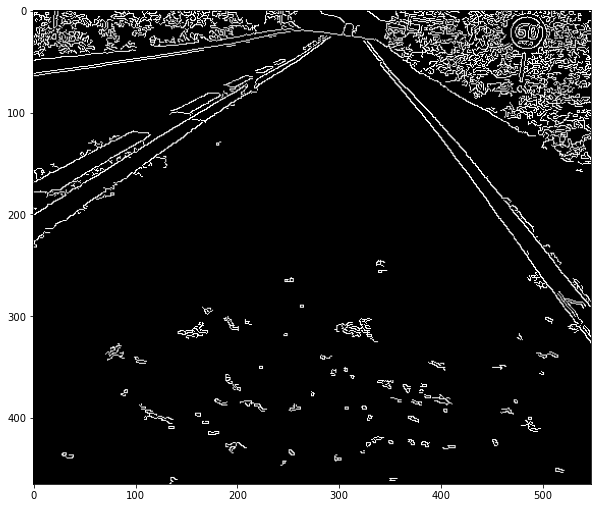

In [5]:
# textura de vegetação
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
bw = cv2.Canny(gray, 50, 200)
show(bw, True)

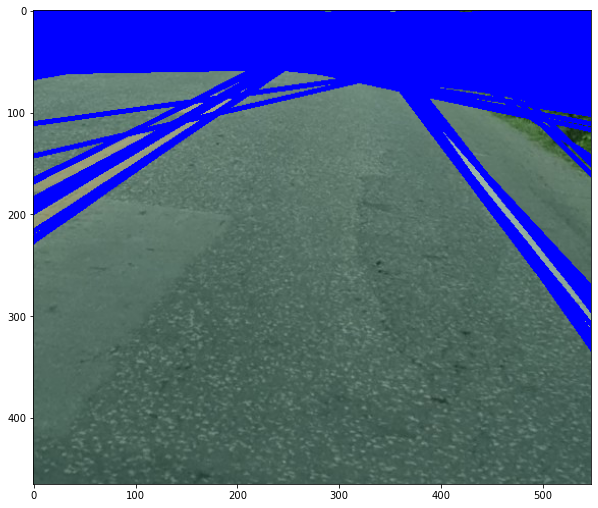

In [11]:
import math
lines = cv2.HoughLines(bw, 1, 
                       np.pi/180, 
                      100 # qtd de interseções para identificar uma reta
                      )

if lines is not None:
    for i in range(0, len(lines)):
        r = lines[i][0][0] # raio
        a = lines[i][0][1] # ângulo
        
        c = math.cos(a)
        s = math.sin(a)
        
        x0 = c*r
        y0 = s * r
        
        pt1 = (int(x0 + 1000*(-s)), int(y0 + 1000*(c)))
        pt2 = (int(x0 - 1000*(-s)), int(y0 - 1000*(c)))
        
        cv2.line(img,
                pt1,
                pt2,
                (0,0,255), # cor da reta
                3)
show(img, True)

In [ ]:
# hough
import cv2 as cv
import numpy as np
import math

src = cv.imread('sudoku.png')

gs = cv.cvtColor(src, cv.COLOR_RGB2GRAY)
dst = cv.Canny(gs, 50, 200)

lines = cv.HoughLines(dst, 1, np.pi / 180, 100, None, 0, 0)

if lines is not None:
   for i in range(0, len(lines)):
      rho = lines[i][0][0]
      theta = lines[i][0][1]
      a = math.cos(theta)
      b = math.sin(theta)
      x0 = a * rho
      y0 = b * rho
      pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
      pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
      cv.line(src, pt1, pt2, (0,0,255), 3, cv.LINE_AA)
      
cv.imshow("lines", src)
cv.waitKey()


In [5]:
# watersheld
import cv2 as cv
import numpy as np
import math
import matplotlib.pyplot as plt

#img = cv.imread('coins.jpg')
gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

ret, thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)

thresh = 255 - thresh

kernel = np.ones((3,3), np.uint8)
opening = cv.morphologyEx(thresh, cv.MORPH_OPEN, kernel, iterations=2)

dilata = cv.dilate(opening, kernel, iterations=3)

dist = cv.distanceTransform(opening, cv.DIST_L2, 5)
ret, moedas = cv.threshold(dist, 0.7*dist.max(), 255, 0)

moedas = np.uint8(moedas)

incerto = cv.subtract(dilata, moedas)

ret, marcadores = cv.connectedComponents(moedas)
marcadores += 1

marcadores[incerto==255] = 0

marcadores = cv.watershed(img, marcadores)

img[marcadores == -1] = [0, 0, 255]

cv.imshow('t1', np.uint8((marcadores/marcadores.max())*255))
cv.imshow('t2', img)

cv.waitKey()



ValueError: assignment destination is read-only

# Extração de Características

# PCA